# SEAM_validate — WT summary panels
Pick any `REF` (any seq with a foreground). Shows, for its WT: raw ISM, cluster average, background-subtracted foreground, the scaled background, per-cluster top/bottom ISM maps, and the SEAM MSM (entropy) cluster overview.

Run under the **`seam_venv`** kernel — the MSM cell needs `seam` (no model/GPU required); the rest only needs numpy/h5py/matplotlib.

In [14]:
import sys
import numpy as np, h5py
import matplotlib.pyplot as plt
from pathlib import Path

sys.path.insert(0, "/grid/koo/home/pmantill/projects/EigenMaps/eigen-interactions")
from fast_logo import fast_logo

PROJ = Path("/grid/koo/home/pmantill/projects/SEAM_validate")
R = PROJ / "results/single_seq"
FIG_DIR = Path("/grid/koo/home/pmantill/projects/SEAM_validate/mcs_k562/figure_scripts/figs")
FIG_DIR.mkdir(exist_ok=True)

# --- pick any ref (any dir under foregrounds with a wt_attribution.npy) ---
REF = "peak84030"
VARIANT = "foregrounds_kmeans300"   # e.g. foregrounds, foregrounds_kmeans200, foregrounds_200k, foregrounds_mut5 ...
LIB_SUFFIX = ""           # library the VARIANT's labels index: "" (100k) | "_200k" | "_300k" | "_mut5" | ...
VAR_START, VAR_END = 15, 215   # variable region within the 230bp insert; maps are over [15:215] -> 200bp

avail = sorted(p.name for p in (R / VARIANT).iterdir() if (p / "wt_attribution.npy").exists())
print(f"{len(avail)} refs in {VARIANT}:")
print(avail)

3 refs in foregrounds_kmeans300:
['peak26256', 'peak27535_Reversed', 'peak84030']


In [15]:
# --- load precomputed WT artifacts for REF ---
d = R / VARIANT / REF
L = lambda n: np.load(d / f"{n}.npy")

wt_ism      = L("wt_attribution")            # (200,4) WT's own ISM-centered map (== ism_centered[0])
ref_avg     = L("ref_cluster_avg")           # (200,4) average map of the WT's cluster
fg_scaled   = L("foreground_scaled")         # (200,4) = ref_avg - average_background_scaled
avg_bg      = L("average_background")         # (200,4) global background (unscaled)
avg_bg_s    = L("average_background_scaled")  # (200,4) global background * bg_scale (this is what's subtracted)
ref_idx     = int(L("ref_cluster_idx"))       # WT's cluster, as a SORTED id (SEAM orders clusters by median DNN)
labels      = L("cluster_labels")             # (N,) RAW k-means id per library seq (WT is row 0)

nz = np.abs(avg_bg) > 0
bg_scale = float(np.median(avg_bg_s[nz] / avg_bg[nz])) if nz.any() else 1.0
# WT is row 0, so its RAW cluster is labels[0]; count members in RAW space (ref_idx is a SORTED id).
n_members = int((labels == labels[0]).sum())
n_clusters = len(np.unique(labels))

print(f"REF={REF}  variant={VARIANT}  N={len(labels)}  clusters={n_clusters}")
print(f"WT cluster: sorted idx={ref_idx}  raw={labels[0]}  members={n_members} "
      f"({100*n_members/len(labels):.1f}%)  bg_scale={bg_scale:.4f}")

REF=peak84030  variant=foregrounds_kmeans300  N=100000  clusters=300
WT cluster: sorted idx=287  raw=159  members=687 (0.7%)  bg_scale=0.8398


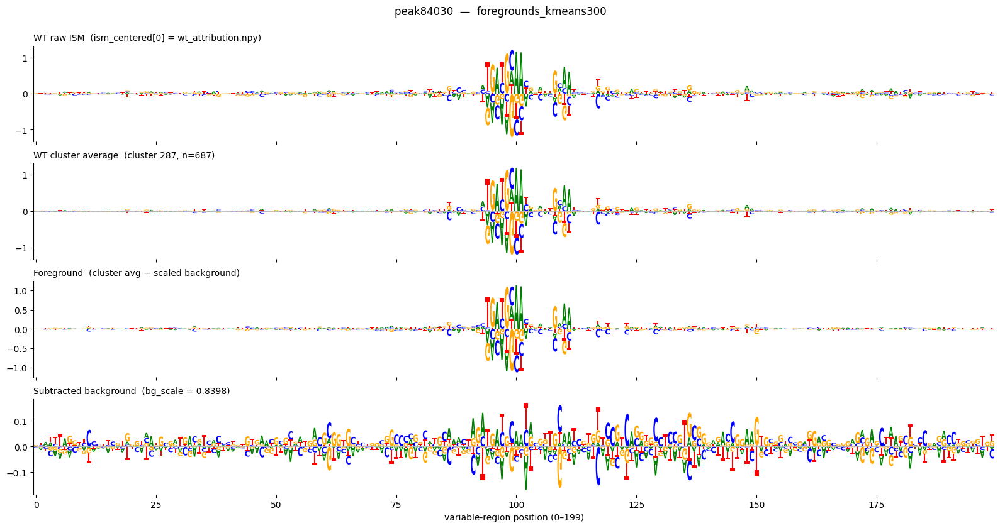

In [16]:
# --- summary figure: WT ISM / cluster avg / foreground / subtracted background ---
panels = [
    (wt_ism,      "WT raw ISM  (ism_centered[0] = wt_attribution.npy)"),
    (ref_avg,     f"WT cluster average  (cluster {ref_idx}, n={n_members})"),
    (fg_scaled,   "Foreground  (cluster avg − scaled background)"),
    (avg_bg_s,    f"Subtracted background  (bg_scale = {bg_scale:.4f})"),
]

fig, axes = plt.subplots(len(panels), 1, figsize=(16, 2.1 * len(panels)), sharex=True)
for ax, (vals, title) in zip(axes, panels):
    fast_logo(vals, ax)                      # full (L,4) ACGT, all channels
    ax.set_title(title, loc="left", fontsize=10)
    ax.axhline(0, color="0.7", lw=0.5)
    for s in ("top", "right", "bottom"):
        ax.spines[s].set_visible(False)
axes[-1].set_xlabel(f"variable-region position (0–{VAR_END - VAR_START - 1})")
fig.suptitle(f"{REF}  —  {VARIANT}", y=0.995, fontsize=12)
fig.tight_layout()
fig.savefig(FIG_DIR / f"{REF}_{VARIANT}_wt_summary_panels.png", dpi=300, bbox_inches="tight")
plt.show()

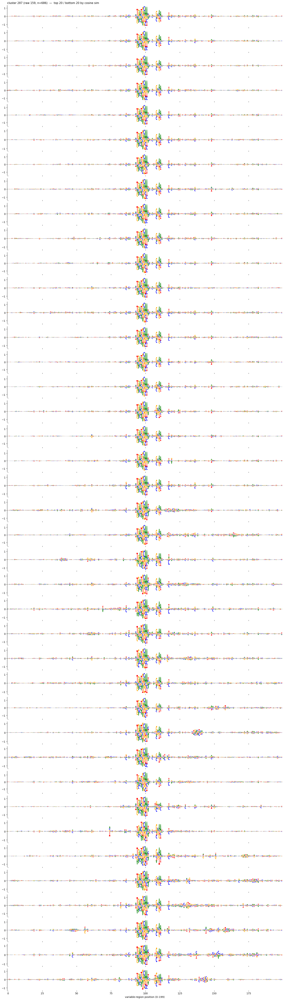

In [17]:
# --- helper: top 20 / bottom 20 raw ISM maps in a cluster, ranked by cosine sim to a reference ---
# Cluster numbering: SEAM saves cluster_labels.npy as RAW k-means ids, but ref_cluster_idx.npy /
# cluster_maps.npy (and the MSM below) use SORTED ids (clusters ordered by median DNN score). This
# helper takes a SORTED id (the number shown on the MSM) and maps it to the raw label to select members.
# cluster_order[sorted_id] = raw label  — reconstructs SEAM's sort_method='median' exactly.
ISM_H5 = R / f"ism{LIB_SUFFIX}" / f"{REF}.h5"          # ism_centered/predictions aligned to cluster_labels
with h5py.File(ISM_H5, "r") as f:
    n_h5 = f["ism_centered"].shape[0]
    assert n_h5 == len(labels), (
        f"library/label mismatch: {ISM_H5.name} has {n_h5} seqs but cluster_labels has {len(labels)}. "
        f"LIB_SUFFIX must point at the library this VARIANT was clustered on."
    )
    predictions = f["predictions"][:]                 # (N,) per-seq predicted activity

raw_ids = np.unique(labels)
cluster_order = raw_ids[np.argsort([np.median(predictions[labels == k]) for k in raw_ids])]  # sorted_id -> raw

def plot_cluster_top_bottom(cluster_id, ref_map=None, exclude=(), tag="", n=20):
    """Top n / bottom n member ISM maps in SORTED cluster_id (the MSM number), ranked by cosine sim to
    ref_map (flattened). ref_map=None -> rank against the cluster's own member-mean ISM map."""
    raw = cluster_order[cluster_id]                   # sorted id (as shown on the MSM) -> raw k-means label
    idx = np.where(labels == raw)[0]
    idx = idx[~np.isin(idx, exclude)]
    with h5py.File(ISM_H5, "r") as f:
        maps = f["ism_centered"][idx]                 # (m,200,4)
    rf = (maps.mean(0) if ref_map is None else ref_map).reshape(-1)
    mf = maps.reshape(maps.shape[0], -1)
    cos = mf @ rf / (np.linalg.norm(mf, axis=1) * np.linalg.norm(rf) + 1e-12)
    order = np.argsort(cos)[::-1]                      # high -> low cosine similarity
    sel = list(order[:n]) + list(order[-n:])          # top n then bottom n
    fig, axes = plt.subplots(len(sel), 1, figsize=(16, 1.4 * len(sel)), sharex=True)
    for ax, j in zip(axes, sel):
        fast_logo(maps[j], ax)                        # full (L,4) ACGT, all channels
        ax.axhline(0, color="0.7", lw=0.5)
        for s in ("top", "right", "bottom"):
            ax.spines[s].set_visible(False)
    axes[0].set_title(f"cluster {cluster_id} (raw {raw}, n={len(idx)})  —  top {n} / bottom {n} by cosine sim",
                      loc="left", fontsize=11)
    axes[-1].set_xlabel(f"variable-region position (0–{VAR_END - VAR_START - 1})")
    fig.tight_layout()
    fig.savefig(FIG_DIR / f"{REF}_{tag or 'cluster'}_cluster{cluster_id}_top{n}_bottom{n}_ism.png",
                dpi=300, bbox_inches="tight")
    plt.show()

# WT cluster: rank members by cosine sim to the WT's own ISM (drop the WT row itself)
plot_cluster_top_bottom(ref_idx, wt_ism, exclude=(0,), tag="wtcluster")

## Cluster overview — SEAM MSM (entropy)

SEAM's native Mechanism Summary Matrix: rows = clusters (**SORTED ids**, same numbering as `ref_cluster_idx`
and the MSM's y-axis), cols = position, colored by per-position Shannon entropy of the aligned sequences in
each cluster (low = a sharp, conserved motif). Rebuilds the `MetaExplainer` from the saved raw labels, so it
needs the **`seam_venv`** kernel (the whole notebook can run under it — no model/GPU required for entropy).

Read a cluster number off the y-axis, then visualize it with `plot_cluster_top_bottom(<that number>)`.

Compiling data...
Converting sequences...


Processing: 100%|██████████| 100000/100000 [00:01<00:00, 51175.87it/s]


Computing Hamming distances...


Processing clusters: 100%|██████████| 300/300 [00:00<00:00, 1976.75it/s]


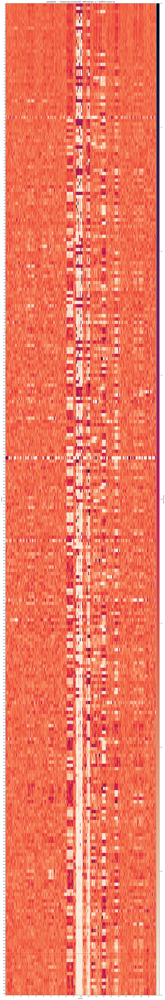

In [18]:
# --- SEAM native MSM (entropy) — pick a cluster number to visualize (needs the seam_venv kernel) ---
from seam import Compiler, Clusterer, MetaExplainer
ALPHABET = ['A', 'C', 'G', 'T']
MUT_RATE = 0.05 if 'mut5' in LIB_SUFFIX else 0.10          # mut5 library is 5% mutation, others 10%

with h5py.File(R / f"mutagenesis_lib{LIB_SUFFIX}" / f"{REF}.h5", "r") as f:
    x_mut  = f["sequences"][:, VAR_START:VAR_END, :]      # (N,200,4)
    wt_seq = f["wt_sequence"][VAR_START:VAR_END, :]       # (200,4)
with h5py.File(ISM_H5, "r") as f:
    attributions = f["ism_centered"][:]                  # (N,200,4)

mave_df   = Compiler(x=x_mut, y=predictions, x_ref=wt_seq[np.newaxis],
                     y_bg=None, alphabet=ALPHABET, gpu=False).compile()
clusterer = Clusterer(attributions, gpu=False)
clusterer.cluster_labels = labels                        # reuse the SAVED raw k-means labels (no re-clustering)
meta = MetaExplainer(clusterer=clusterer, mave_df=mave_df, attributions=attributions,
                     sort_method='median', ref_idx=0, mut_rate=MUT_RATE)   # 'median' -> SORTED ids == ref_cluster_idx
meta.generate_msm(gpu=False)
meta.compute_background(mut_rate=MUT_RATE, entropy_multiplier=0.5,
                        adaptive_background_scaling=True, process_logos=False)  # -> per-cluster bg scaling

cluster_maps = L("cluster_maps")                          # (n_clusters,200,4) SORTED-indexed average maps

def plot_cluster_avg_fg(cluster_id, tag=""):
    """For a SORTED cluster_id (the MSM number): average attribution map (top) + foreground (bottom)."""
    raw   = cluster_order[cluster_id]
    avg   = cluster_maps[cluster_id]                                     # cluster average map
    scale = meta.background_scaling[cluster_id]
    fg    = avg - scale * meta.background                                # foreground = avg − scaled background
    panels = [(avg, f"cluster {cluster_id} (raw {raw}) average attribution"),
              (fg,  f"cluster {cluster_id} foreground  (avg − {scale:.3f}·background)")]
    fig, axes = plt.subplots(2, 1, figsize=(16, 2.1 * 2), sharex=True)
    for ax, (vals, title) in zip(axes, panels):
        fast_logo(vals, ax)
        ax.set_title(title, loc="left", fontsize=11)
        ax.axhline(0, color="0.7", lw=0.5)
        for s in ("top", "right", "bottom"):
            ax.spines[s].set_visible(False)
    axes[-1].set_xlabel(f"variable-region position (0–{VAR_END - VAR_START - 1})")
    fig.tight_layout()
    fig.savefig(FIG_DIR / f"{REF}_cluster{cluster_id}_avg_foreground.png", dpi=300, bbox_inches="tight")
    plt.show()

# render SEAM's entropy MSM on our own (tall) figure so every cluster number is legible
fig = plt.figure(figsize=(15, max(8, 0.30 * n_clusters)))   # ~0.30 in per row -> room to label every cluster
main_ax, cbar_ax, corder, mat = meta.plot_msm(column="Entropy", gui=True, gui_figure=fig)
yt = np.arange(0.5, n_clusters, 1)                          # a tick + label for EVERY cluster (sorted id)
main_ax.set_yticks(yt)
main_ax.set_yticklabels([str(int(t - 0.5)) for t in yt], fontsize=7)
main_ax.tick_params(axis="y", length=2, pad=1)
for lab_ in main_ax.get_yticklabels():                      # highlight the WT cluster's number
    if lab_.get_text() == str(ref_idx):
        lab_.set_color("red"); lab_.set_fontweight("bold")
main_ax.axhline(ref_idx + 0.5, color="red", lw=1.0)        # mark the WT cluster row (sorted id == ref_idx)
main_ax.set_title(f"{REF}  —  {VARIANT}   MSM entropy  (y = SORTED cluster id)", fontsize=11)
fig.savefig(FIG_DIR / f"{REF}_{VARIANT}_msm_entropy.png", dpi=300, bbox_inches="tight")
plt.show()

# then, e.g.:  plot_cluster_top_bottom(41)   # top/bottom member ISM maps for a cluster number
#              plot_cluster_avg_fg(41)        # that cluster's average map + foreground

In [19]:
# --- SEAM CSM mismatch heatmap — same MSM matrix as the entropy plot above, colored by % mismatch to WT ---
# meta.msm carries a 'Reference' column = per-position % mismatch to the WT reference (populated by
# generate_msm). plot_msm(column='Reference') renders the whole matrix as rows=clusters x cols=position,
# exactly like the entropy MSM but with the mismatch colormap. cluster_id (a SORTED id, the MSM number)
# only picks which row to highlight in red, mirroring the WT-cluster highlight on the entropy plot.
def plot_cluster_mismatch(cluster_id, tag=""):
    fig = plt.figure(figsize=(15, max(8, 0.30 * n_clusters)))   # match the entropy heatmap's tall layout
    main_ax, cbar_ax, corder, mat = meta.plot_msm(column="Reference", gui=True, gui_figure=fig)
    yt = np.arange(0.5, n_clusters, 1)                          # a tick + label for EVERY cluster (sorted id)
    main_ax.set_yticks(yt)
    main_ax.set_yticklabels([str(int(t - 0.5)) for t in yt], fontsize=7)
    main_ax.tick_params(axis="y", length=2, pad=1)
    for lab_ in main_ax.get_yticklabels():                      # highlight the requested cluster's number
        if lab_.get_text() == str(cluster_id):
            lab_.set_color("red"); lab_.set_fontweight("bold")
    main_ax.axhline(cluster_id + 0.5, color="red", lw=1.0)      # mark the requested cluster row
    main_ax.set_title(f"{REF}  —  {VARIANT}   MSM % mismatch to WT  (y = SORTED cluster id)", fontsize=11)
    fig.savefig(FIG_DIR / f"{REF}_{tag or VARIANT}_msm_mismatch.png", dpi=300, bbox_inches="tight")
    plt.show()

# e.g.:  plot_cluster_mismatch(41)   # full mismatch-to-WT heatmap, cluster 41 highlighted


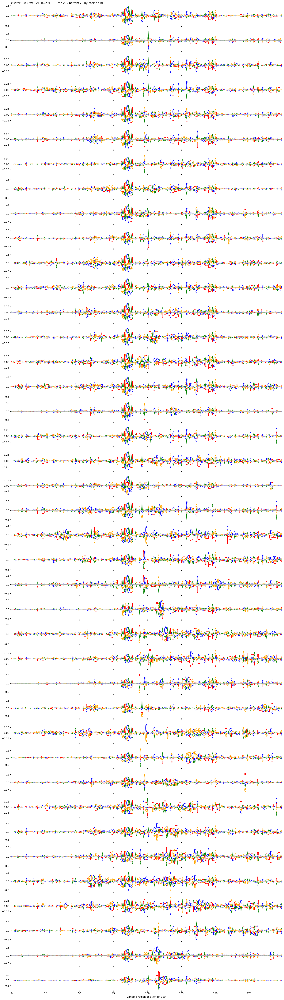

In [20]:
plot_cluster_top_bottom(134)

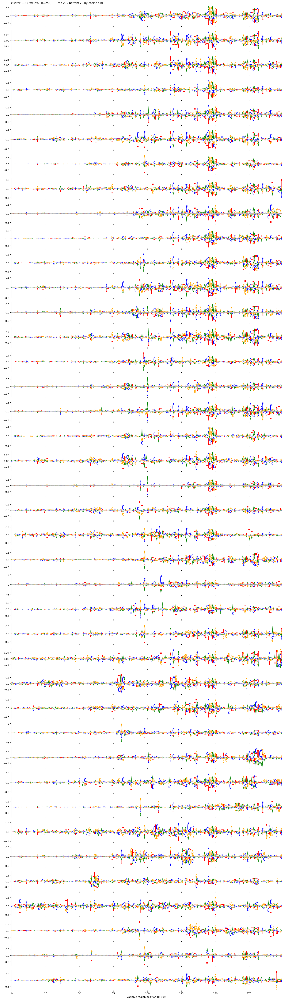

In [21]:
plot_cluster_top_bottom(118)

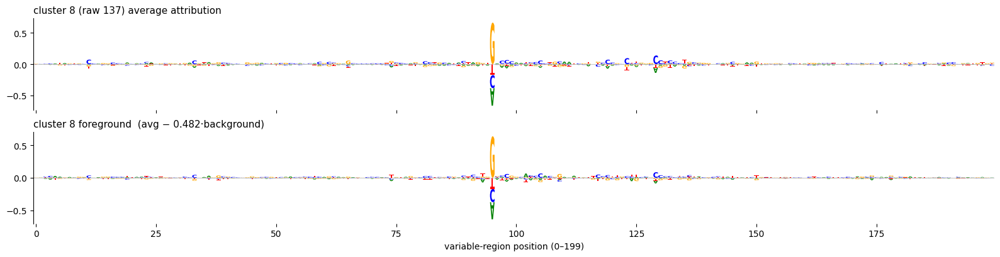

In [28]:
plot_cluster_avg_fg(8)

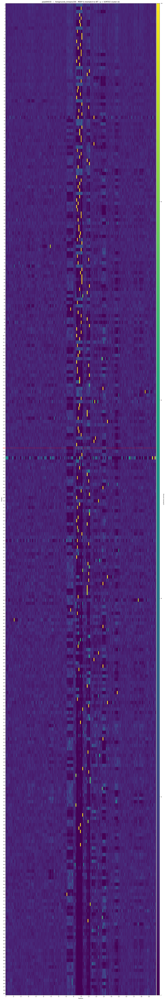

In [23]:
plot_cluster_mismatch(134)

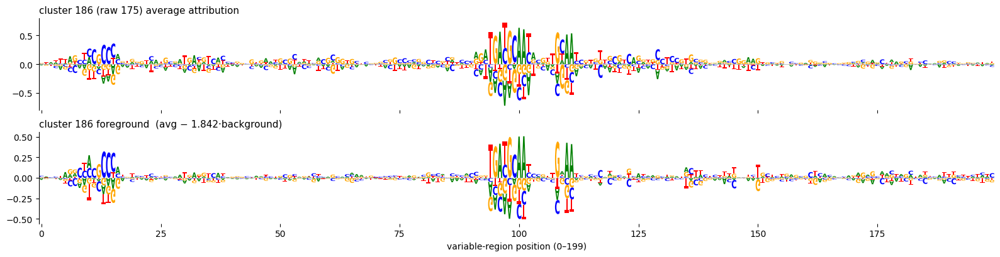

In [33]:
plot_cluster_avg_fg(186)

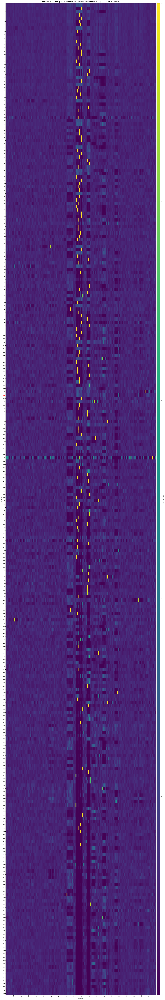

In [25]:
plot_cluster_mismatch(118)